Install additional packages

In [1]:
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.0 MB/s eta 0:00:00


Imports

In [2]:
import glob
import matplotlib.pyplot as plt
import imageio
import numpy as np
import os
import PIL
import time
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras import layers

from IPython import display


Parameters

In [3]:
plt.rcParams["figure.figsize"] = (7,8)

In [4]:
IMAGE_SHAPE=(32,32,3)
BLOCK_SIZE = (16, 16)

# Dataset

load dataset

In [5]:
(y_train, _), (y_test,_) = tf.keras.datasets.cifar10.load_data()
y_train = tf.convert_to_tensor(y_train, dtype=tf.float32)
y_test = tf.convert_to_tensor(y_test, dtype=tf.float32)
y_train = (y_train) / 255. # Normalize the images to [0, 1]
y_test = (y_test) / 255.  # Normalize the images to [0, 1]

170498071/170498071 [==============================] - 2s 0us/step


cutout 

In [6]:
x_train = tf.identity(y_train)
x_test = tf.identity(y_test)

In [7]:
class RandomCutout():
  def __init__(self, mask_size=(16,16), border=(0,0), name = 'random_cutout', **kwargs):
    super(RandomCutout, self).__init__(**kwargs)
    
    self.mask_size = mask_size
    self.border = border

  def __call__(self, image_batch):
      x = tf.shape(image_batch)[1]
      y = tf.shape(image_batch)[2]

      xoffset = tf.cast(tf.math.ceil(self.mask_size[0] / 2.) + self.border[0], dtype=tf.int32)
      yoffset = tf.cast(tf.math.ceil(self.mask_size[1] / 2.) + self.border[1], dtype=tf.int32)
      xmin, xmax = xoffset, x - xoffset
      ymin, ymax = yoffset, y - yoffset

      if xmin < xmax:
        xoffset = tf.random.uniform(shape=[], minval=xmin, maxval=xmax, dtype=tf.dtypes.int32)
      else:
        xoffset = tf.cast(x / 2, dtype=tf.int32)
      if ymin < ymax:
        yoffset = tf.random.uniform(shape=[], minval=ymin, maxval=ymax, dtype=tf.dtypes.int32)
      else:
        yoffset = tf.cast(y / 2, dtype=tf.int32)

      xmin, xmax = xoffset - tf.cast(tf.math.ceil(self.mask_size[0] / 2.), dtype=tf.int32), xoffset + tf.cast(tf.math.ceil(self.mask_size[0] / 2.), dtype=tf.int32)
      ymin, ymax = yoffset - tf.cast(tf.math.ceil(self.mask_size[1] / 2.), dtype=tf.int32), yoffset + tf.cast(tf.math.ceil(self.mask_size[1] / 2.), dtype=tf.int32)
      

      mask = tfa.image.cutout(tf.zeros_like(image_batch), mask_size=self.mask_size, offset=(yoffset,xoffset), constant_values=1.)
      context = image_batch * (1 - mask)
      random_block = image_batch * mask
      return context, random_block, mask, (ymin, xmin, ymax-ymin, xmax-xmin)

In [8]:
random_cutout = RandomCutout(mask_size=BLOCK_SIZE, border=(2,2))

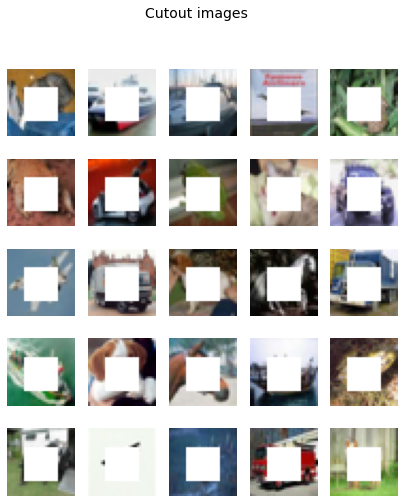

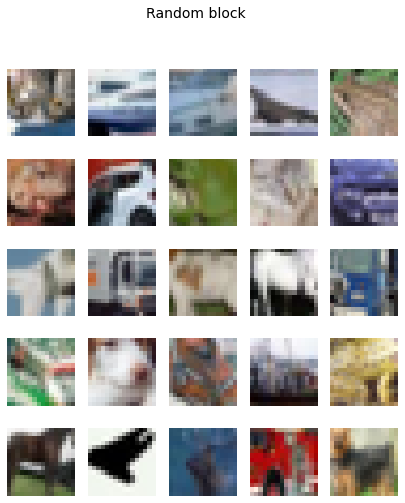

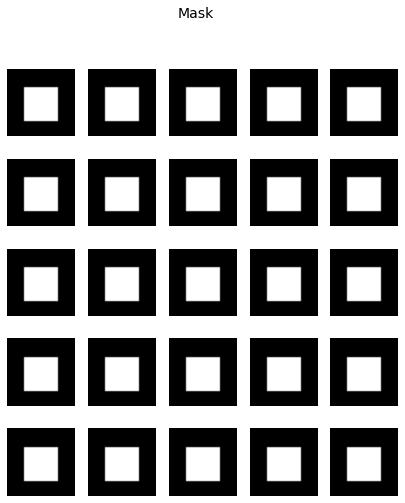

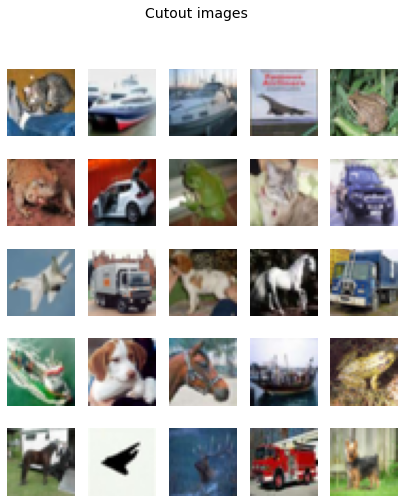

In [9]:
y_batch = y_test[:25]
context, random_block, mask, coords = random_cutout(y_batch)
# (yoffset, xoffset, ytarget, xtarget)
fig = plt.figure()
plt.suptitle("Cutout images", fontsize=14)
for i, img in enumerate(context + mask):
    plt.subplot(5,5 ,i+1)
    plt.imshow(img)
    plt.axis('off')

plt.savefig('image_at_epoch_0000.png')
plt.show()

fig = plt.figure()
plt.suptitle("Random block", fontsize=14)
block = tf.image.crop_to_bounding_box(random_block, *coords)
for i, img in enumerate(block):
    plt.subplot(5,5 ,i+1)
    plt.imshow((img))
    plt.axis('off')

plt.show()

fig = plt.figure()
plt.suptitle("Mask", fontsize=14)
for i, img in enumerate(mask):
    plt.subplot(5,5 ,i+1)
    plt.imshow(img)
    plt.axis('off')

plt.show()


fig = plt.figure()
plt.suptitle("Cutout images", fontsize=14)
for i, (b,c) in enumerate(zip(random_block, context)):
    plt.subplot(5,5 ,i+1)
    plt.imshow((b+c))
    plt.axis('off')

plt.show()

# Models


## generator

In [10]:
def Generator(input_shape=(32,32,3)):
    inputs = layers.Input(input_shape)
    # Encoder
    x = layers.Conv2D(64, (5,5), strides=1, padding="same")(inputs) 
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(128, (3,3), strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x) 

    x = layers.Conv2D(128, (3,3), strides=1, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(256, (3,3), strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(256, (3,3), strides=1, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(256, (3,3), strides=1, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # dilation convolutions
    x = layers.Conv2D(256, (3,3), strides=1, dilation_rate=(2,2), padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(256, (3,3), strides=1, dilation_rate=(4,4) ,padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # x = layers.Conv2D(256, (3,3), strides=1, dilation_rate=(8,8) ,padding="same", activation=tf.keras.activations.elu)(x)
    # x = layers.Conv2D(256, (3,3), strides=1, dilation_rate=(16,16) ,padding="same", activation=tf.keras.activations.elu)(x)
    

    # Decoder
    x = layers.Conv2D(256, (3,3), strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(256, (3,3), strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(128, (4,4), strides=2, padding="same")(x) 
    x = layers.Conv2D(128, (3,3), strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    x = layers.Conv2DTranspose(64, (4,4), strides=2, padding="same")(x) 
    x = layers.Conv2D(32, (3,3), strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    outputs = layers.Conv2D(3, (3,3), strides=1, padding='same',activation='sigmoid')(x)  

    model = tf.keras.Model(inputs, outputs, name="Generator")

    return model

generator = Generator()
generator.summary()

Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        4864      
                                                                 
 batch_normalization (BatchN  (None, 32, 32, 64)       256       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       73856     
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 128)      512       
 hNormalization)                                         

## discriminator

In [11]:
LOCAL_BLOCK_SHAPE = BLOCK_SIZE + (3,)
def LDiscriminator(input_shape=LOCAL_BLOCK_SHAPE):
    inputs = layers.Input((input_shape))
    x = layers.Conv2D(64, (5,5), strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(128, (5,5), strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # x = layers.Conv2D(256, (5,5), strides=2, padding="same")(x)
    # x = layers.BatchNormalization()(x)
    # x = layers.ReLU()(x)

    # x = layers.Conv2D(512, (5,5), strides=2, padding="same")(x)
    # x = layers.BatchNormalization()(x)
    # x = layers.ReLU()(x)

    # x = layers.Conv2D(512, (5,5), strides=2, padding="same")(x)
    # x = layers.BatchNormalization()(x)
    # x = layers.ReLU()(x)

    x = layers.Flatten()(x)
    outputs = layers.Dense(1024, activation="sigmoid")(x)

    model = tf.keras.Model(inputs, outputs, name="LocalDiscriminator")
    return model

ldiscriminator = LDiscriminator()
ldiscriminator.summary()

Model: "LocalDiscriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 16, 16, 3)]       0         
                                                                 
 conv2d_13 (Conv2D)          (None, 8, 8, 64)          4864      
                                                                 
 batch_normalization_12 (Bat  (None, 8, 8, 64)         256       
 chNormalization)                                                
                                                                 
 re_lu_12 (ReLU)             (None, 8, 8, 64)          0         
                                                                 
 conv2d_14 (Conv2D)          (None, 4, 4, 128)         204928    
                                                                 
 batch_normalization_13 (Bat  (None, 4, 4, 128)        512       
 chNormalization)                               

In [12]:
def GDiscriminator(input_shape=(32,32,3)):
    inputs = layers.Input((input_shape))
    x = layers.Conv2D(64, (5,5), strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(128, (5,5), strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(256, (5,5), strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # x = layers.Conv2D(512, (5,5), strides=2, padding="same")(x)
    # x = layers.BatchNormalization()(x)
    # x = layers.ReLU()(x)

    # x = layers.Conv2D(512, (5,5), strides=2, padding="same")(x)
    # x = layers.BatchNormalization()(x)
    # x = layers.ReLU()(x)

    # x = layers.Conv2D(512, (5,5), strides=2, padding="same")(x)
    # x = layers.BatchNormalization()(x)
    # x = layers.ReLU()(x)

    x = layers.Flatten()(x)
    outputs = layers.Dense(1024, activation="sigmoid")(x)

    model = tf.keras.Model(inputs, outputs, name="GlobalDiscriminator")
    return model

gdiscriminator = GDiscriminator()
gdiscriminator.summary()

Model: "GlobalDiscriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_15 (Conv2D)          (None, 16, 16, 64)        4864      
                                                                 
 batch_normalization_14 (Bat  (None, 16, 16, 64)       256       
 chNormalization)                                                
                                                                 
 re_lu_14 (ReLU)             (None, 16, 16, 64)        0         
                                                                 
 conv2d_16 (Conv2D)          (None, 8, 8, 128)         204928    
                                                                 
 batch_normalization_15 (Bat  (None, 8, 8, 128)        512       
 chNormalization)                              

Model: "discriminator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_25 (Conv2D)             (None, 16, 16, 64)   4864        ['input_7[0][0]']                
                                                                                                  
 batch_normalization_24 (BatchN  (None, 16, 16, 64)  256         ['conv2d_25[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 input_6 (InputLayer)           [(None, 16, 16, 3)]  0           []                   

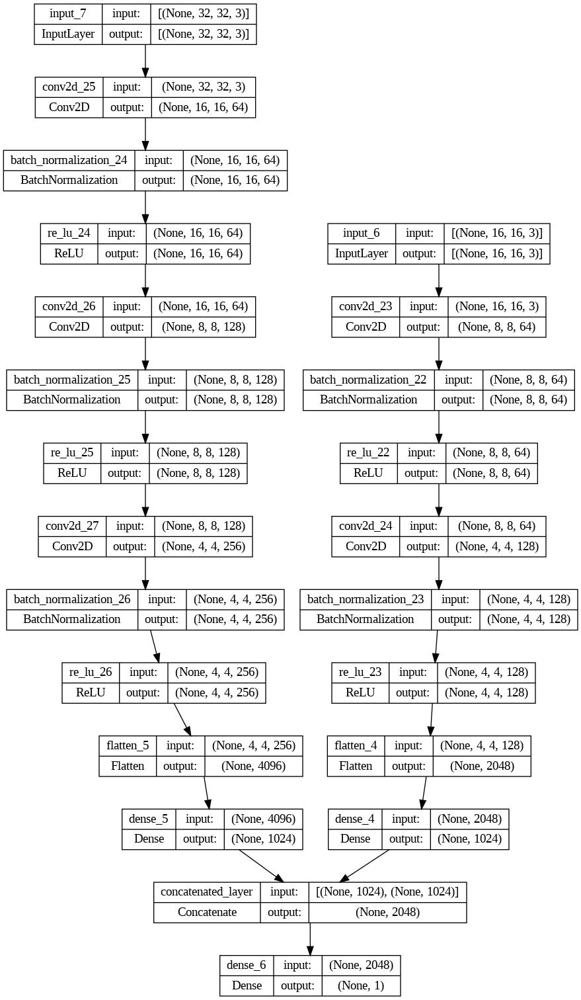

In [13]:
ld = LDiscriminator()
gd = GDiscriminator()
from tensorflow.keras.layers import Input, Dense, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model


def Discriminator(ldiscriminator, gdiscriminator):
  ld = ldiscriminator
  gd = gdiscriminator

  #Final Layer
  x = layers.Concatenate(name="concatenated_layer")([ld.output, gd.output])
  output_layer = layers.Dense(1, activation = "sigmoid")(x)

  #Model Definition 
  model = tf.keras.Model(inputs=[(ld.inputs,gd.inputs)], outputs=output_layer, name = "discriminator")
  return model
  
discriminator = Discriminator(LDiscriminator(), GDiscriminator())
discriminator.summary()
plot_model(discriminator, "discriminator_architecture.png", show_shapes=True)

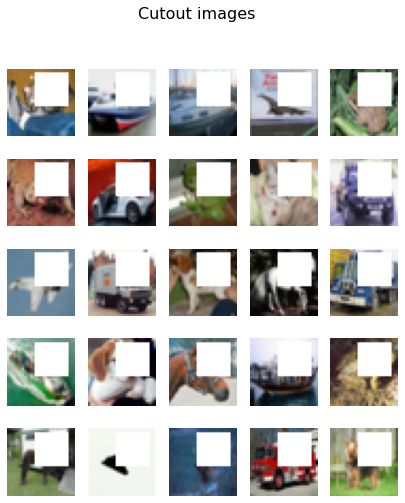

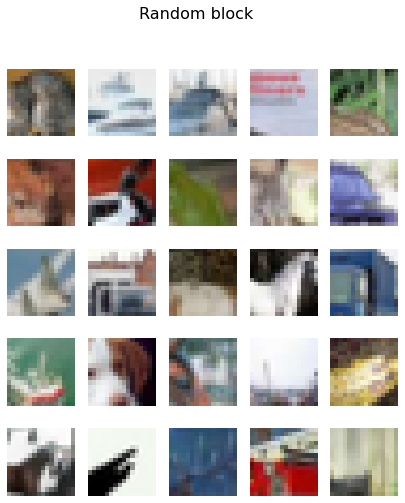

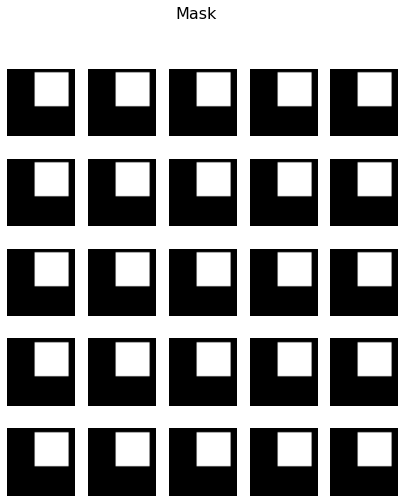

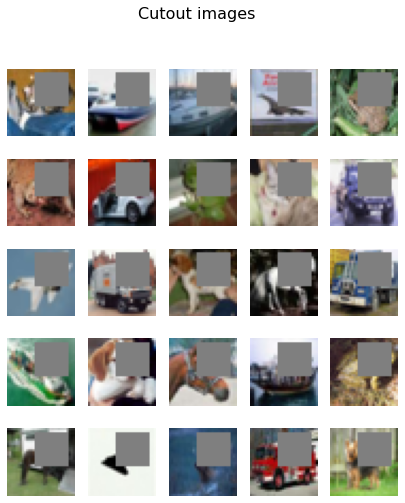

In [14]:
test_batch = y_test[:25]
context, random_block, mask, coords = random_cutout(test_batch)
reconstructed = context+ generator(context)*mask

fig = plt.figure()
plt.suptitle("Cutout images", fontsize=16)
for i, img in enumerate(context + mask):
    plt.subplot(5,5 ,i+1)
    plt.imshow(img)
    plt.axis('off')

plt.show()

fig = plt.figure()
plt.suptitle("Random block", fontsize=16)
block = tf.image.crop_to_bounding_box(random_block, *coords)
for i, img in enumerate(block):
    plt.subplot(5,5 ,i+1)
    plt.imshow((img))
    plt.axis('off')

plt.show()

fig = plt.figure()
plt.suptitle("Mask", fontsize=16)
for i, img in enumerate(mask):
    plt.subplot(5,5 ,i+1)
    plt.imshow(img)
    plt.axis('off')

plt.show()


fig = plt.figure()
plt.suptitle("Cutout images", fontsize=16)
for i, img in enumerate(reconstructed):
    plt.subplot(5,5 ,i+1)
    plt.imshow(img)
    plt.axis('off')

# plt.tight_layout()
plt.show()

## metrics

In [15]:
class psnr_metric(tf.keras.metrics.Metric):
    def __init__(self, name = 'psnr', **kwargs):
        super(psnr_metric, self).__init__(**kwargs)
        self.value = self.add_weight('value', initializer = 'zeros')
        self.count = self.add_weight('count', initializer = 'zeros')

    def update_state(self, y_true, y_pred,sample_weight=None):
        self.value.assign_add(tf.reduce_mean(tf.image.psnr(y_true, y_pred, 2)))
        self.count.assign_add(1)

    def reset_state(self):
        self.value.assign(0)
        self.count.assign(0)

    def result(self):
        return self.value / self.count

psnr = psnr_metric()

test_batch = y_test[:25]
context, random_block, mask, cords = random_cutout(test_batch)

reconstructed = context+generator(context)*mask


psnr(test_batch,reconstructed)

<tf.Tensor: shape=(), dtype=float32, numpy=24.857338>

In [16]:
class ssim_metric(tf.keras.metrics.Metric):
    def __init__(self, name = 'ssim', **kwargs):
        super(ssim_metric, self).__init__(**kwargs)
        self.value = self.add_weight('value', initializer = 'zeros')
        self.count = self.add_weight('count', initializer = 'zeros')

    def update_state(self, y_true, y_pred,sample_weight=None):
        self.value.assign_add(tf.reduce_mean(tf.image.ssim(y_true, y_pred, 2)))
        self.count.assign_add(1)

    def reset_state(self):
        self.value.assign(0)
        self.count.assign(0)

    def result(self):
        return self.value / self.count

ssim = ssim_metric()

test_batch = y_test[:25]
context, random_block, mask, cords = random_cutout(test_batch)
reconstructed = context+generator(context)*mask

ssim(test_batch,reconstructed)

<tf.Tensor: shape=(), dtype=float32, numpy=0.56222993>

# Context encoder class

In [17]:
class ContextEncoder(tf.keras.Model):
    """Combines the encoder and decoder into an end-to-end model for training."""
    def __init__(self, 
                  discriminator,
                  generator,
                  generator_extra_steps=1,
                  discriminator_extra_steps=1,
                  mask_size=(16,16),
                  border=(2,2),
                  name="context_encoder"):
      super(ContextEncoder, self).__init__()

      self.discriminator = discriminator
      self.generator = generator

      self.d_steps = discriminator_extra_steps
      self.g_steps = generator_extra_steps

      self.psnr_metric = psnr_metric(name="psnr")
      self.ssim_metric = ssim_metric(name="ssim")

      self.mask_size = mask_size
      self.border = border


    def compile(self, generator_optimizer, discriminator_optimizer, generator_loss, discriminator_loss):
      super(ContextEncoder, self).compile()
      self.generator_optimizer = generator_optimizer
      self.generator_loss = generator_loss
      self.discriminator_optimizer=discriminator_optimizer
      self.discriminator_loss = discriminator_loss

    @property
    def metrics(self):
        # We list our `Metric` objects here so that `reset_states()` can be
        # called automatically at the start of each epoch
        # or at the start of `evaluate()`.
        # If you don't implement this property, you have to call
        # `reset_states()` yourself at the time of your choosing.
        # metrics = super().metrics
        # metrics.append(self.psnr_metric)
        return [self.psnr_metric, self.ssim_metric]

    @tf.function
    def test_step(self, data):
      if isinstance(data, tuple):
            x_batch = data[0]
            y_batch = data[1]

      context, random_region,mask, coords = random_cutout(x_batch)
      context_white = context + mask
      real_images = y_batch

      # Generate fake images from the latent vector
      generated = self.generator(context_white, training=False)
      fake_images = context + generated * mask

      fake_block = tf.image.crop_to_bounding_box(fake_images, *coords)
      real_block = tf.image.crop_to_bounding_box(real_images, *coords)
      # Get the logits for the fake images
      fake_logits = self.discriminator([fake_block, fake_images], training=False)
      # Get the logits for the real images
      real_logits = self.discriminator([real_block, real_images], training=False)

      # Calculate loss
      d_loss = self.discriminator_loss(real_logits, fake_logits)
      g_loss = self.generator_loss(fake_logits, real_images, fake_images)

      self.psnr_metric.update_state(real_images,fake_images)
      self.ssim_metric.update_state(real_images,fake_images)
      return {"g_loss": g_loss,"d_loss": d_loss, "psnr": self.psnr_metric.result(), "ssim": self.ssim_metric.result()}


    @tf.function
    def train_step(self, data):
      if isinstance(data, tuple):
            x_batch = data[0]
            y_batch = data[1]

      context, random_region, mask, coords = random_cutout(x_batch)
      context_white = context + mask
      real_images = y_batch

      for i in range(self.d_steps):
        with tf.GradientTape() as tape:
          # Generate fake images from the latent vector
          generated = self.generator(context_white, training=True)
          fake_images = context + generated * mask
          fake_block = tf.image.crop_to_bounding_box(fake_images, *coords)
          real_block = tf.image.crop_to_bounding_box(real_images, *coords)
          # Get the logits for the fake images
          fake_logits = self.discriminator([fake_block, fake_images], training=True)
          # Get the logits for the real images
          real_logits = self.discriminator([real_block, real_images], training=True)

          # Calculate loss
          d_loss = self.discriminator_loss(real_logits, fake_logits)

        # Get the gradients w.r.t the discriminator loss
        d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # Update the weights of the discriminator using the discriminator optimizer
        self.discriminator_optimizer.apply_gradients(zip(d_gradient, self.discriminator.trainable_variables))

      for i in range(self.g_steps):
        with tf.GradientTape() as tape:
          # Generate fake images using the generator
          generated = self.generator(context_white, training=True)
          fake_images = context + generated * mask
          fake_block = tf.image.crop_to_bounding_box(fake_images, *coords)
          # Get the discriminator logits for fake images
          gen_img_logits = self.discriminator([fake_block, fake_images], training=True)
          # Calculate the generator loss
          g_loss = self.generator_loss(gen_img_logits, real_block, fake_block)

        # Get the gradients w.r.t the generator loss
        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update the weights of the generator using the generator optimizer
        self.generator_optimizer.apply_gradients(zip(gen_gradient, self.generator.trainable_variables))

      # Compute our own metrics
      self.psnr_metric.update_state(real_images,fake_images)
      self.ssim_metric.update_state(real_images,fake_images)
      return {"g_loss": g_loss,"d_loss": d_loss, "psnr": self.psnr_metric.result(), "ssim": self.ssim_metric.result()}

# Compile

## loss

In [18]:
test_batch = y_test[:25]
context, random_region, mask, coords = random_cutout(test_batch)
reconstructed = context+generator(context)*mask

In [19]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()
mse = tf.keras.losses.MeanSquaredError()
mae = tf.keras.losses.MeanAbsoluteError()


In [20]:
def discriminator_loss(real_preds, fake_preds):
  real_loss = cross_entropy(tf.ones_like(real_preds), real_preds)
  fake_loss = cross_entropy(tf.zeros_like(fake_preds), fake_preds)
  total_loss = real_loss + fake_loss
  return total_loss


fake_block = tf.image.crop_to_bounding_box(reconstructed, *coords)
real_block = tf.image.crop_to_bounding_box(test_batch, *coords)
discriminator_loss(discriminator([real_block, test_batch], training=False), discriminator([fake_block, reconstructed], training=False))

<tf.Tensor: shape=(), dtype=float32, numpy=1.3986899>

In [21]:
def adv_loss(fake_preds):
  return cross_entropy(tf.ones_like(fake_preds), fake_preds)

def rec_loss(y_true, y_pred):
  return mse(y_true, y_pred)     # MSE / L2
  # return mae(y_true, y_pred)  # MAE / L1

rec_loss(tf.ones((128,32,32,3)),tf.zeros((128,32,32,3)))

<tf.Tensor: shape=(), dtype=float32, numpy=1.0>

In [22]:
LAM_REC = 0.999
LAM_ADV = 0.001
def generator_loss(fake_logits, real_images, fake_images):
    return LAM_REC * rec_loss(real_images, fake_images) + LAM_ADV * adv_loss(fake_logits)

fake_block = tf.image.crop_to_bounding_box(reconstructed, *coords)
generator_loss(discriminator([fake_block, reconstructed], training=False), test_batch, reconstructed)

<tf.Tensor: shape=(), dtype=float32, numpy=0.016094072>

## optimizers

In [25]:
# Instantiate the optimizer for both networks
# (learning_rate=0.0002, beta_1=0.5 are recommended)

LR = 0.0002
BETA1 = 0.9
# generator_optimizer = tf.keras.optimizers.experimental.Adadelta(0.0001)
# discriminator_optimizer= tf.keras.optimizers.experimental.Adadelta(0.0001)
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=LR*10, beta_1=BETA1)            
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=LR*3, beta_1=BETA1)       

## model compile

In [26]:
MASK_SIZE = (16,16)
BORDER = (2,2)
ctxtenc = ContextEncoder(discriminator=Discriminator(LDiscriminator(), GDiscriminator()), 
                         generator= Generator(),
                         mask_size=MASK_SIZE,
                         border=BORDER)

ctxtenc.compile(generator_loss = generator_loss, 
             discriminator_loss=discriminator_loss,
             generator_optimizer=generator_optimizer,
             discriminator_optimizer=discriminator_optimizer,)

# Training

In [27]:
images_to_show = x_test[:25]
print(images_to_show.shape)

(25, 32, 32, 3)


In [28]:
class GANMonitor(tf.keras.callbacks.Callback):
    def __init__(self, images_to_show=None, save_every=1,mask_size=(16,16),border=(8,8)):
        self.images_to_show = images_to_show
        self.save_every = save_every
        self.random_cutout = RandomCutout(mask_size, border)
        print(self.images_to_show.shape)

    def on_epoch_end(self, epoch, logs=None):
      if (epoch + 1) % self.save_every == 0:
        
        context, random_region, mask, coords = self.random_cutout(self.images_to_show)
        
        context_white = context + mask
        generated = self.model.generator(context_white, training=False)

        reconstructed_images = context + generated * mask

        plt.ioff()
        fig = plt.figure()
        plt.suptitle(f"epoch:{epoch+1}")
        for i in range(reconstructed_images.shape[0]):
            plt.subplot(5,5, i+1)
            plt.imshow((reconstructed_images[i]))
            plt.axis('off')
        plt.tight_layout()
        plt.savefig('image_at_epoch_{:04d}.png'.format(epoch+1))
        plt.close(fig)

show_images = GANMonitor(images_to_show=images_to_show, save_every=1, mask_size=(16,16), border=(8,8))

(25, 32, 32, 3)


In [29]:
EPOCHS =40
BATCH_SIZE = 128
history = ctxtenc.fit(x=x_train,
                      y=y_train,
                      validation_data=(x_test, y_test),
                      epochs=EPOCHS, 
                      initial_epoch = 0,
                      batch_size = BATCH_SIZE,
                      shuffle=True, 
                      callbacks=[show_images])

Epoch 1/40
391/391 [==============================] - 78s 177ms/step - g_loss: 0.0468 - d_loss: 0.3745 - psnr: 26.0911 - ssim: 0.6432 - val_g_loss: 0.0442 - val_d_loss: 0.8812 - val_psnr: 20.6458 - val_ssim: 0.5040
Epoch 2/40
391/391 [==============================] - 66s 168ms/step - g_loss: 0.0386 - d_loss: 0.4428 - psnr: 27.3186 - ssim: 0.6919 - val_g_loss: 0.0114 - val_d_loss: 1.0830 - val_psnr: 27.0164 - val_ssim: 0.6888
Epoch 3/40
391/391 [==============================] - 66s 168ms/step - g_loss: 0.0373 - d_loss: 0.4802 - psnr: 27.3836 - ssim: 0.6983 - val_g_loss: 0.0135 - val_d_loss: 1.4877 - val_psnr: 27.1436 - val_ssim: 0.6867
Epoch 4/40
391/391 [==============================] - 66s 168ms/step - g_loss: 0.0370 - d_loss: 0.5666 - psnr: 27.4488 - ssim: 0.7003 - val_g_loss: 0.0253 - val_d_loss: 0.9013 - val_psnr: 24.5766 - val_ssim: 0.6321
Epoch 5/40
391/391 [==============================] - 66s 168ms/step - g_loss: 0.0358 - d_loss: 0.4756 - psnr: 27.9127 - ssim: 0.7207 - val_

# Visualization

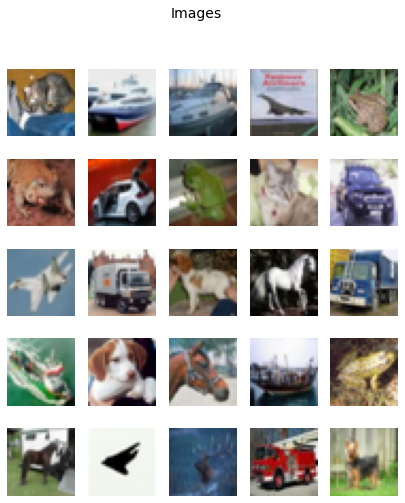

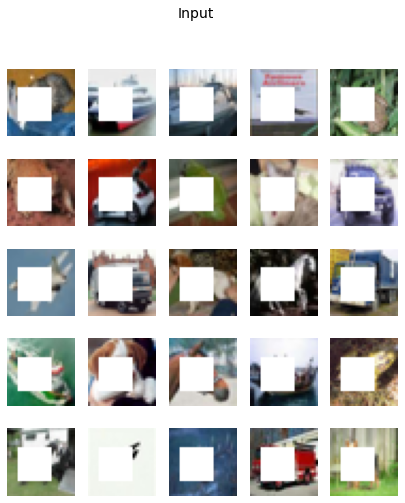

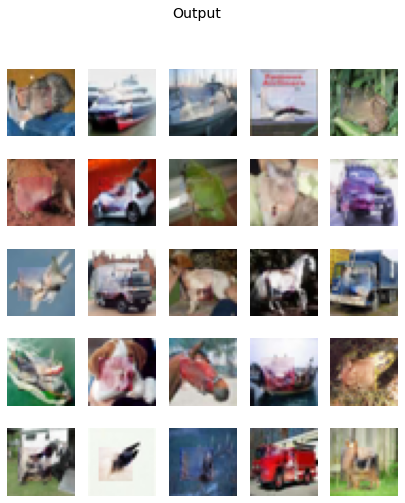

In [30]:
test_batch = y_test[:25]
context, random_block, mask, coords = random_cutout(test_batch)
context_white = context + mask
reconstructed = context + ctxtenc.generator(context_white, training=False)*mask

fig = plt.figure()
plt.suptitle("Images", fontsize=14)
for i, img in enumerate(test_batch):
    plt.subplot(5,5 ,i+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

fig = plt.figure()
plt.suptitle("Input", fontsize=14)
for i, img in enumerate(context+mask):
    plt.subplot(5,5 ,i+1)
    plt.imshow(img)
    plt.axis('off')

plt.show()

fig = plt.figure()
plt.suptitle("Output", fontsize=14)
for i, img in enumerate(reconstructed):
    plt.subplot(5,5 ,i+1)
    plt.imshow(img)
    plt.axis('off')

plt.show()

## plots

In [31]:
## Plot train and validation curves
g_loss = history.history['g_loss']
val_g_loss =  history.history['val_g_loss']

d_loss =  history.history['d_loss']
val_d_loss =  history.history['val_d_loss']

psnr =  history.history['psnr']
val_psnr =  history.history['val_psnr']

ssim =  history.history['ssim']
val_ssim =  history.history['val_ssim']

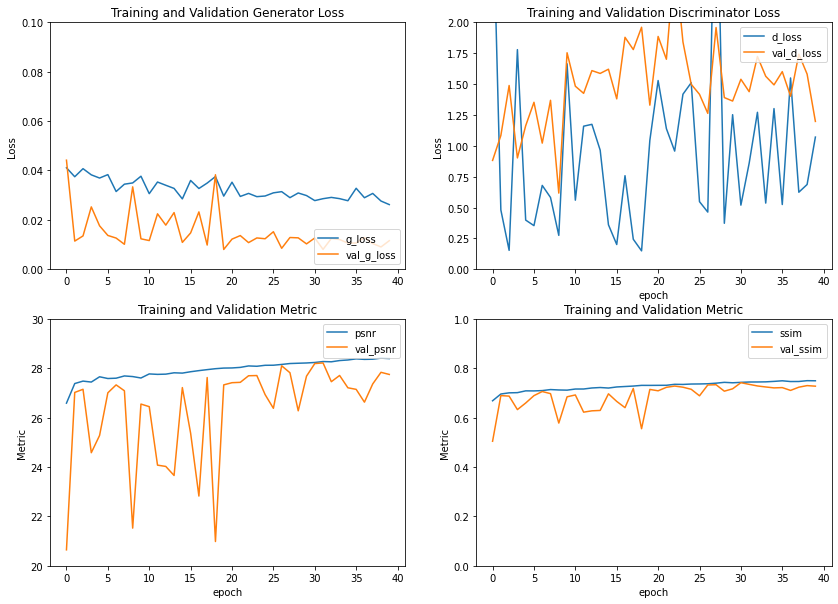

In [32]:
plt.figure(figsize=(14,10))
plt.subplot(2, 2, 1)
plt.plot(g_loss, label='g_loss')
plt.plot(val_g_loss, label='val_g_loss')
plt.legend(loc='lower right')
plt.ylabel('Loss')
plt.ylim([0,.1])
plt.title('Training and Validation Generator Loss')

plt.subplot(2, 2, 2)
plt.plot(d_loss, label='d_loss')
plt.plot(val_d_loss, label='val_d_loss')
plt.legend(loc='upper right')
plt.ylabel('Loss')
plt.ylim([0,2])
plt.title('Training and Validation Discriminator Loss')
plt.xlabel('epoch')

plt.subplot(2, 2, 3)
plt.plot(psnr, label='psnr')
plt.plot(val_psnr, label='val_psnr')
plt.legend(loc='upper right')
plt.ylabel('Metric')
plt.ylim([20,30])
plt.title('Training and Validation Metric')
plt.xlabel('epoch')


plt.subplot(2,2, 4)
plt.plot(ssim, label='ssim')
plt.plot(val_ssim, label='val_ssim')
plt.legend(loc='upper right')
plt.ylabel('Metric')
plt.ylim([0,1])
plt.title('Training and Validation Metric')
plt.xlabel('epoch')

plt.savefig('l_rate_d=3x0_0002__l_rate_g=10x0_0002.png')
plt.show()

## last epoch output

In [33]:
history.epoch[-1]

39

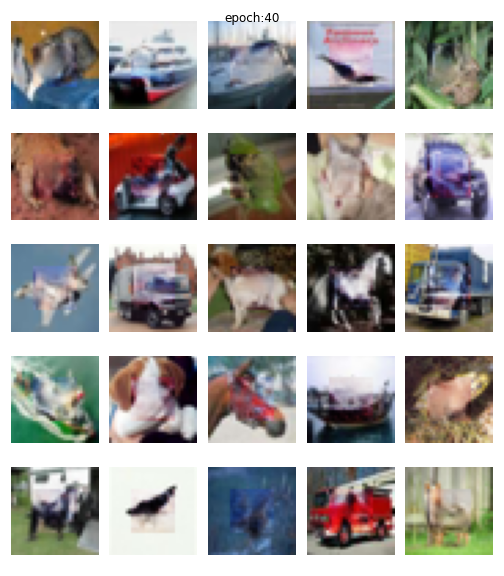

In [34]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))
display_image(history.epoch[-1]+1)

## gif

In [35]:
# To generate GIFs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-6uk_2cz6
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-6uk_2cz6
  Resolved https://github.com/tensorflow/docs to commit 7d9aab3abb979d304e768df250b7fd069d60497e
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=184416 sha256=29907f6356cdfa63495c1f63c70227c44b2c8447764ece769a2f9b4982ada3f9
  Stored in directory: /tmp/pip-ephem-wheel-cache-fm7wycm1/wheels/3b/ee/a2/ab4d36a9a4af495bcb936f3e849d4b497b65fa40548a68d6c3
Successfully built tensorflow-docs


In [36]:
anim_file = 'dcgan.gif'

filenames = glob.glob('image*.png')
filenames = sorted(filenames)
frames = []
for i,filename in enumerate(filenames):
  if i % 1 == 0:
    image = imageio.imread(filename)
    frames.append(image)
imageio.mimsave(anim_file, frames, format='GIF', fps=4)



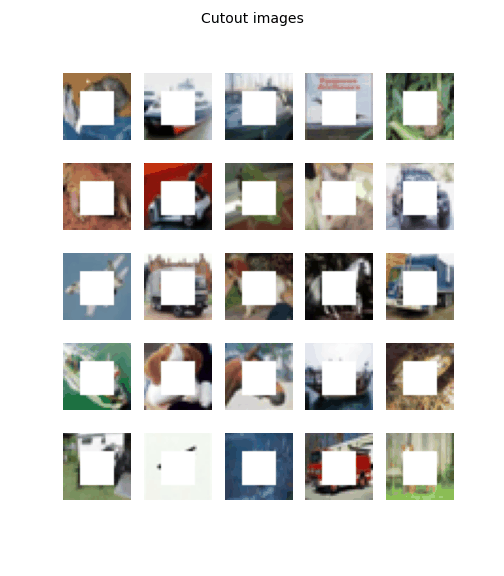

In [37]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)
